- Vary Latent Space (2,8,16,32)
- Visualize Latent Space by using Dimensionality Reduction Technique (https://hackernoon.com/latent-space-visualization-deep-learning-bits-2-bd09a46920df)
- Implement GIF from Medium Article https://medium.com/@outerrencedl/a-simple-autoencoder-and-latent-space-visualization-with-pytorch-568e4cd2112a
    - Plot Latent Space afte each Training Step to see how it learns 

## Compare screws and metal_nut classes

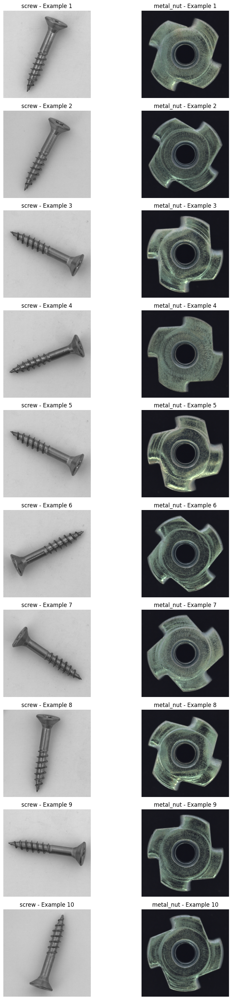

In [5]:
import matplotlib.pyplot as plt
from PIL import Image
import os
import random

def plot_class_examples(data_folder, class1, class2, num_examples=10):
    fig, axes = plt.subplots(num_examples, 2, figsize=(10, num_examples * 3))
    
    for idx in range(num_examples):
        # Get random image from class1
        class1_folder = os.path.join(data_folder, class1, 'train', 'good')
        class1_image_path = os.path.join(class1_folder, random.choice(os.listdir(class1_folder)))
        class1_image = Image.open(class1_image_path).convert('RGB')
        
        # Get random image from class2
        class2_folder = os.path.join(data_folder, class2, 'train', 'good')
        class2_image_path = os.path.join(class2_folder, random.choice(os.listdir(class2_folder)))
        class2_image = Image.open(class2_image_path).convert('RGB')
        
        # Plot images
        axes[idx, 0].imshow(class1_image)
        axes[idx, 0].axis('off')
        axes[idx, 0].set_title(f"{class1} - Example {idx+1}")

        axes[idx, 1].imshow(class2_image)
        axes[idx, 1].axis('off')
        axes[idx, 1].set_title(f"{class2} - Example {idx+1}")
    
    plt.tight_layout()
    plt.show()

data_folder = '/Users/hendriksippel/Documents/Repositories/itu-aml-anomaly-detection/data'
plot_class_examples(data_folder, 'screw', 'metal_nut', num_examples=10)

## Inspect Classes

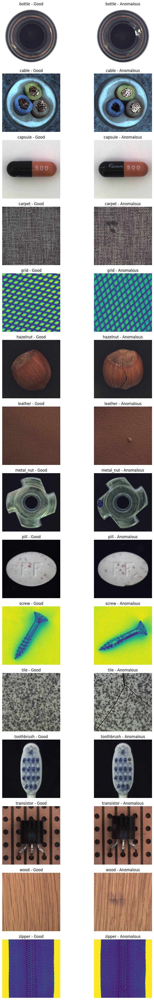

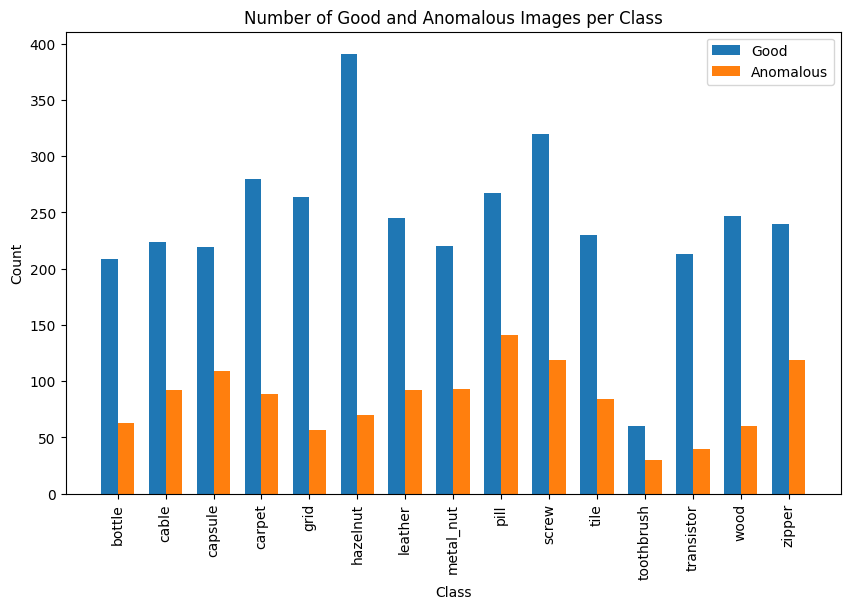

In [1]:
import os
import matplotlib.pyplot as plt
from PIL import Image

# Define paths
data_folder = '../data/'
classes = [
    "bottle", "cable", "capsule", "carpet", "grid", "hazelnut", "leather",
    "metal_nut", "pill", "screw", "tile", "toothbrush", "transistor", "wood", "zipper"
]

# Function to plot a "good" and an "anomalous" image for each class
def plot_good_and_anomalous(data_folder, classes):
    fig, axes = plt.subplots(len(classes), 2, figsize=(10, len(classes) * 3))
    
    for idx, object_name in enumerate(classes):
        # Define paths
        train_folder = os.path.join(data_folder, object_name, 'train', 'good')
        test_folder = os.path.join(data_folder, object_name, 'test')
        
        # Get "good" image
        good_image_path = os.path.join(train_folder, os.listdir(train_folder)[0])
        good_image = Image.open(good_image_path)
        
        # Find and open an "anomalous" image
        anomaly_subfolders = [f for f in os.listdir(test_folder) if f != "good"] # disregard not anamolous images from test folder
        if anomaly_subfolders:
            anomaly_folder = os.path.join(test_folder, anomaly_subfolders[0])
            anomalous_image_path = os.path.join(anomaly_folder, os.listdir(anomaly_folder)[0])
            anomalous_image = Image.open(anomalous_image_path)
        else:
            anomalous_image = None

        # Plot images
        axes[idx, 0].imshow(good_image)
        axes[idx, 0].axis('off')
        axes[idx, 0].set_title(f"{object_name} - Good")

        if anomalous_image:
            axes[idx, 1].imshow(anomalous_image)
            axes[idx, 1].axis('off')
            axes[idx, 1].set_title(f"{object_name} - Anomalous")
        else:
            axes[idx, 1].axis('off')
            axes[idx, 1].set_title(f"{object_name} - No Anomalies")
    
    plt.tight_layout()
    plt.show()

# Function to count "good" and "anomalous" images per class
def count_images(data_folder, classes):
    count_dict = {}

    for object_name in classes:
        train_folder = os.path.join(data_folder, object_name, 'train', 'good')
        test_folder = os.path.join(data_folder, object_name, 'test')
        
        # Count good images
        good_count = len(os.listdir(train_folder))
        
        # Count anomalous images
        anomaly_subfolders = [f for f in os.listdir(test_folder) if f != "good"]
        anomaly_count = sum(len(os.listdir(os.path.join(test_folder, sub))) for sub in anomaly_subfolders)

        count_dict[object_name] = {"Good": good_count, "Anomalous": anomaly_count}
    
    # Display the count in a bar plot
    labels = count_dict.keys()
    good_counts = [count_dict[cls]["Good"] for cls in labels]
    anomaly_counts = [count_dict[cls]["Anomalous"] for cls in labels]

    fig, ax = plt.subplots(figsize=(10, 6))
    width = 0.35
    x = range(len(labels))
    
    ax.bar(x, good_counts, width, label='Good')
    ax.bar([p + width for p in x], anomaly_counts, width, label='Anomalous')
    
    ax.set_xlabel('Class')
    ax.set_ylabel('Count')
    ax.set_title('Number of Good and Anomalous Images per Class')
    ax.set_xticks([p + width / 2 for p in x])
    ax.set_xticklabels(labels, rotation=90)
    ax.legend()
    
    plt.show()

# Run functions
plot_good_and_anomalous(data_folder, classes)
count_images(data_folder, classes)


## Display Class Specific Data

https://www.kaggle.com/code/ahmedali30/plasticanamolydetection-svm/notebook

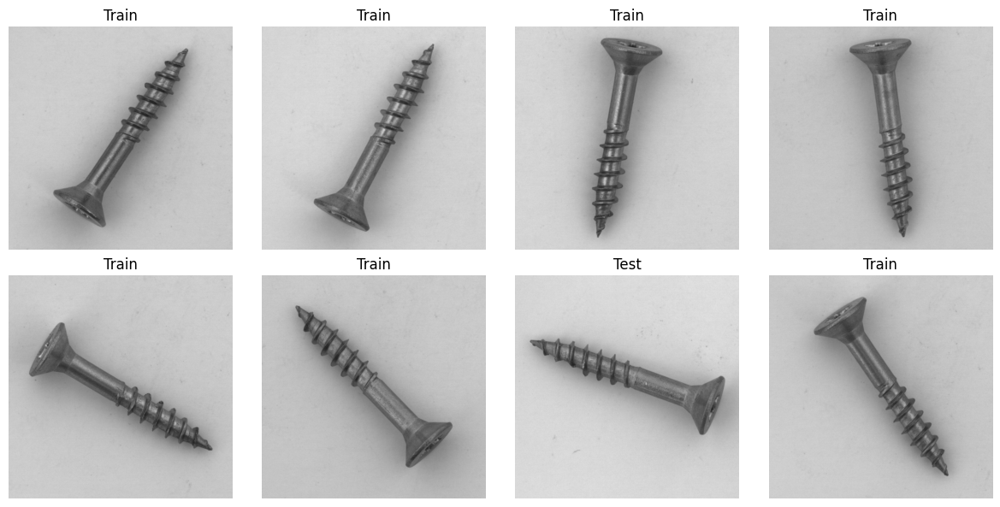

In [3]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import random

def show_random_images(train_folder, test_folder, num_images=8):
    """Displays a grid of random images from the training and test folders with labels."""

    # Get a list of image paths from both folders
    train_images = [os.path.join(train_folder, img) for img in os.listdir(train_folder)]
    test_images = [os.path.join(test_folder, subfolder, img) for subfolder in os.listdir(test_folder) for img in os.listdir(os.path.join(test_folder, subfolder))]

    # Combine the image paths and labels
    all_images = train_images + test_images
    all_labels = ['Train'] * len(train_images) + ['Test'] * len(test_images)

    # Randomly sample images and labels
    samples = list(zip(all_images, all_labels))
    random.shuffle(samples)
    images, labels = zip(*samples[:num_images])

    # Create a grid of subplots
    num_rows = 2
    num_cols = num_images // 2
    fig, axes = plt.subplots(nrows=num_rows, ncols=num_cols, figsize=(12, 6))

    # Display the images with labels
    for i, (image_path, label) in enumerate(zip(images, labels)):
        img = cv2.imread(image_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Convert from BGR to RGB
        ax = axes.flat[i]
        ax.imshow(img)
        ax.set_title(label)
        ax.axis('off')

    plt.tight_layout()
    plt.show()

# Example usage:
data_folder = '/Users/jonathan/Library/Mobile Documents/com~apple~CloudDocs/Master/3_Semester/AML/AML_Project/data/'
object_name = 'screw'
train_folder = os.path.join(data_folder, object_name, 'train', 'good')
test_folder = os.path.join(data_folder, object_name, 'test')

show_random_images(train_folder, test_folder, num_images=8)


https://www.kaggle.com/code/ahmedali30/plasticanamolydetection-svm/notebook

Image shape: (150528,)


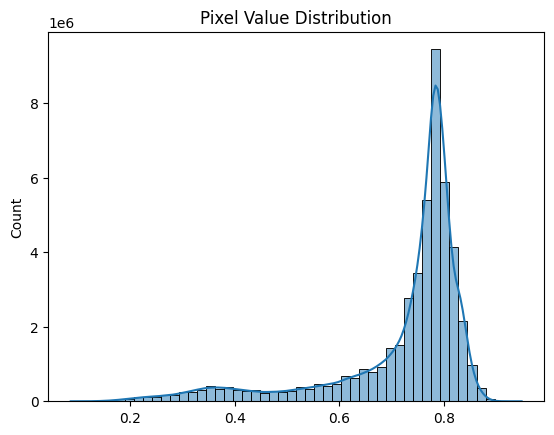

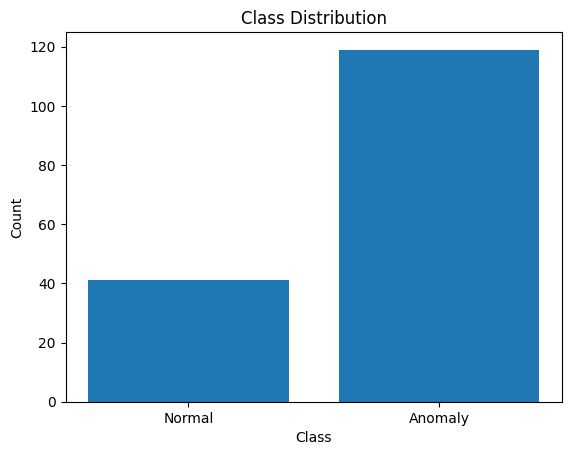

In [2]:
def load_images(folder_path):
    images = []
    for filename in os.listdir(folder_path):
        img_path = os.path.join(folder_path, filename)
        try:
            img = cv2.imread(img_path)
            if img is None:
                print(f"Error loading image: {img_path}")
                continue
            img = cv2.resize(img, (224, 224))
            img = img / 255.0
            images.append(img.flatten())
        except Exception as e:
            print(f"Error processing image: {img_path}, Error: {e}")
    return np.array(images)

def load_test_data(test_folder_path):
    X_test = []
    y_test = []
    for subfolder in os.listdir(test_folder_path):
        subfolder_path = os.path.join(test_folder_path, subfolder)
        for filename in os.listdir(subfolder_path):
            img_path = os.path.join(subfolder_path, filename)
            try:
                img = cv2.imread(img_path)
                if img is None:
                    print(f"Error loading image: {img_path}")
                    continue
                img = cv2.resize(img, (224, 224))
                img = img / 255.0
                X_test.append(img.flatten())
                if subfolder == 'good':
                    y_test.append(0)  # Normal
                else:
                    y_test.append(1)  # Anomaly
            except Exception as e:
                print(f"Error processing image: {img_path}, Error: {e}")
    return np.array(X_test), np.array(y_test)

def analyze_data_distribution(train_images, y_test):
    # Image shape analysis
    image_shape = train_images[0].shape
    print(f"Image shape: {image_shape}")

    # Pixel value distribution
    flattened_images = train_images.reshape(-1)
    sns.histplot(flattened_images, bins=50, kde=True)
    plt.title('Pixel Value Distribution')
    plt.show()

    # Class distribution
    class_counts = np.bincount(y_test)
    plt.bar(range(len(class_counts)), class_counts)
    plt.xticks(range(len(class_counts)), ['Normal', 'Anomaly'])
    plt.xlabel('Class')
    plt.ylabel('Count')
    plt.title('Class Distribution')
    plt.show()
    
data_folder = '/Users/jonathan/Library/Mobile Documents/com~apple~CloudDocs/Master/3_Semester/AML/AML_Project/data/'
object_name = 'screw'

train_folder = os.path.join(data_folder, object_name, 'train', 'good')
test_folder = os.path.join(data_folder, object_name, 'test')

train_images = load_images(train_folder)
X_test, y_test = load_test_data(test_folder)

# Analyze data distribution
analyze_data_distribution(train_images, y_test)

### Show Anomalies and Ground Truth

https://www.kaggle.com/code/stpeteishii/toothbrush-anomalies-autoencoder

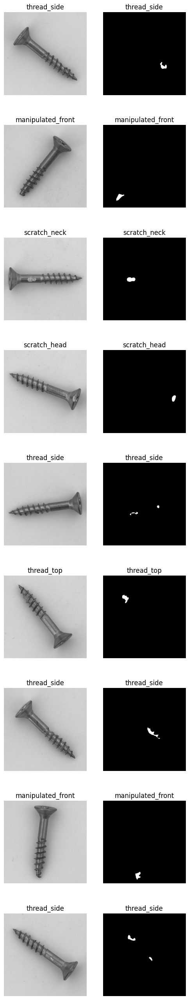

In [ ]:
paths=[]
object_name = 'screw'

for dirname, _, filenames in os.walk('/Users/jonathan/Library/Mobile Documents/com~apple~CloudDocs/Master/3_Semester/AML/AML_Project/data/screw/test'):
    for filename in filenames:
        if dirname.split('/')[-1]!='good':
            paths+=[(os.path.join(dirname, filename))]
paths=random.sample(paths,9)

dir0='/Users/jonathan/Library/Mobile Documents/com~apple~CloudDocs/Master/3_Semester/AML/AML_Project/data/screw/ground_truth'

fig, axs = plt.subplots(9,2,figsize=(6,33))
for i in range(9):
    r=i

    path=paths[i]
    img = plt.imread(path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    label=path.split('/')[-2]
    ax=axs[r][0].axis("off")
    ax=axs[r][0].set_title(label)
    ax=axs[r][0].imshow(img)

    path=paths[i]
    file=path.split('/')[-1].split('.')[0]+'_mask.png'
    label=path.split('/')[-2]    
    path2=os.path.join(dir0,label,file)
    img = plt.imread(path2)
    ax=axs[r][1].axis("off")
    ax=axs[r][1].set_title(label)
    ax=axs[r][1].imshow(img,cmap="gray")
    
plt.show()

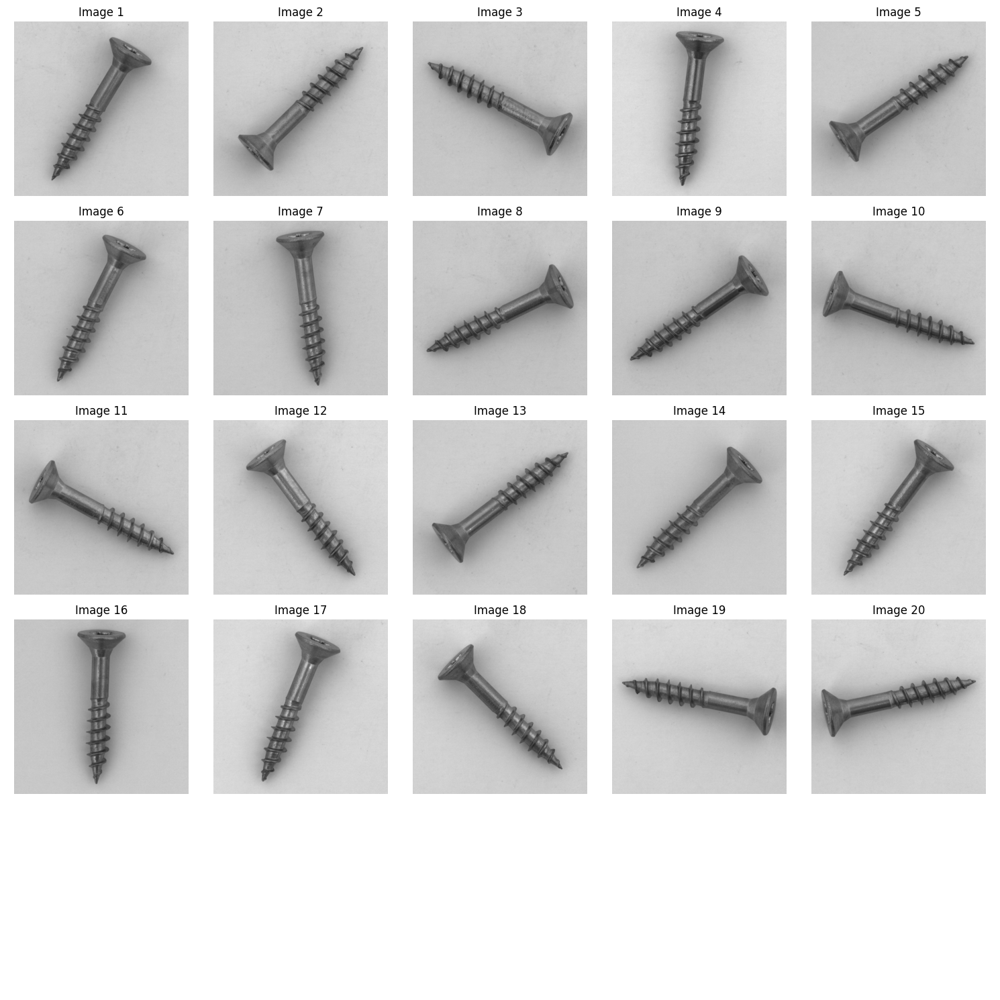

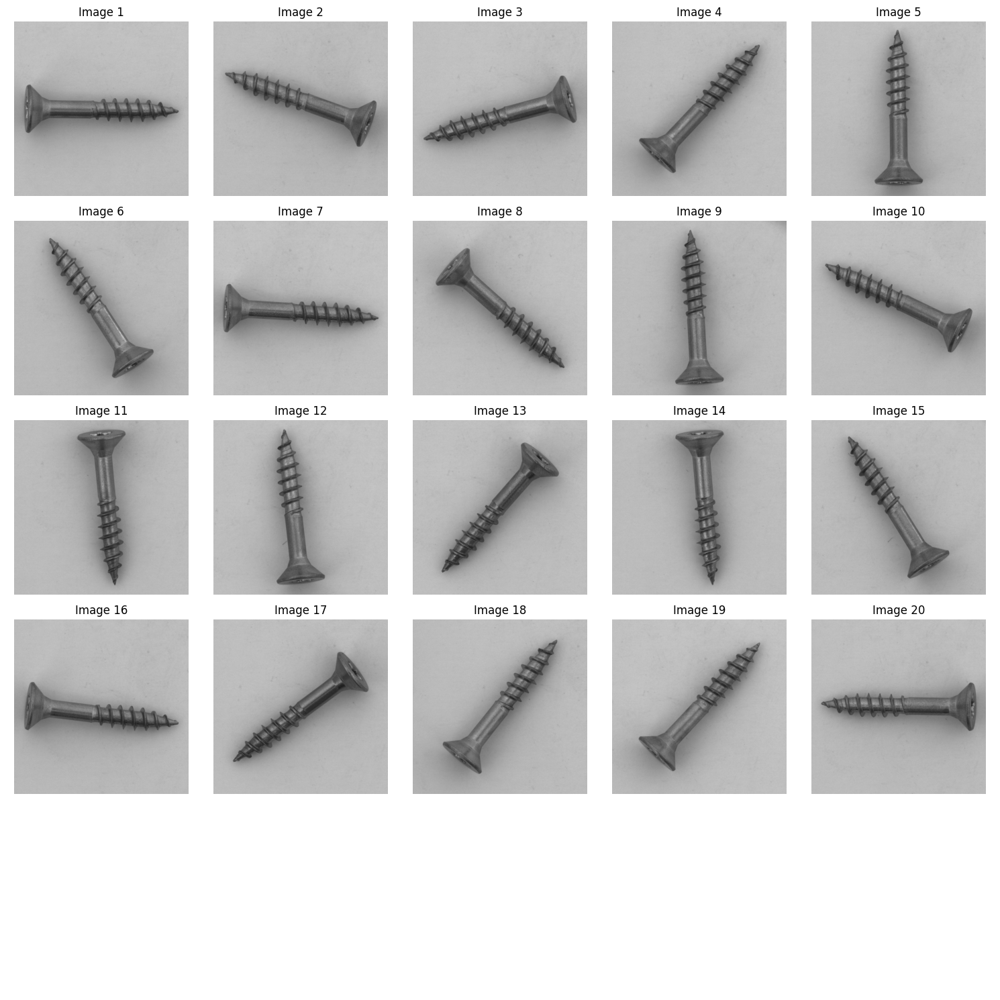

In [3]:
import os
import cv2
import matplotlib.pyplot as plt

def plot_all_images(train_folder, max_images=20):
    image_paths = [os.path.join(train_folder, img) for img in os.listdir(train_folder)[:max_images]]
    num_images = len(image_paths)
    num_cols = 5
    num_rows = (num_images // num_cols) + 1

    fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, num_rows * 3))

    for i, image_path in enumerate(image_paths):
        img = cv2.imread(image_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        ax = axes.flat[i]
        ax.imshow(img)
        ax.axis('off')
        ax.set_title(f"Image {i+1}")

    for i in range(num_images, num_rows * num_cols):
        axes.flat[i].axis('off')

    plt.tight_layout()
    plt.show()

data_folder = '/Users/hendriksippel/Documents/Repositories/itu-aml-anomaly-detection/data'

# Example usage for the "screw" class train folder:
train_folder = os.path.join(data_folder, 'screw', 'train', 'good')
plot_all_images(train_folder)

# Example usage for the "screw" class test folder:
test_folder = os.path.join(data_folder, 'screw', 'test', 'good')
plot_all_images(test_folder)

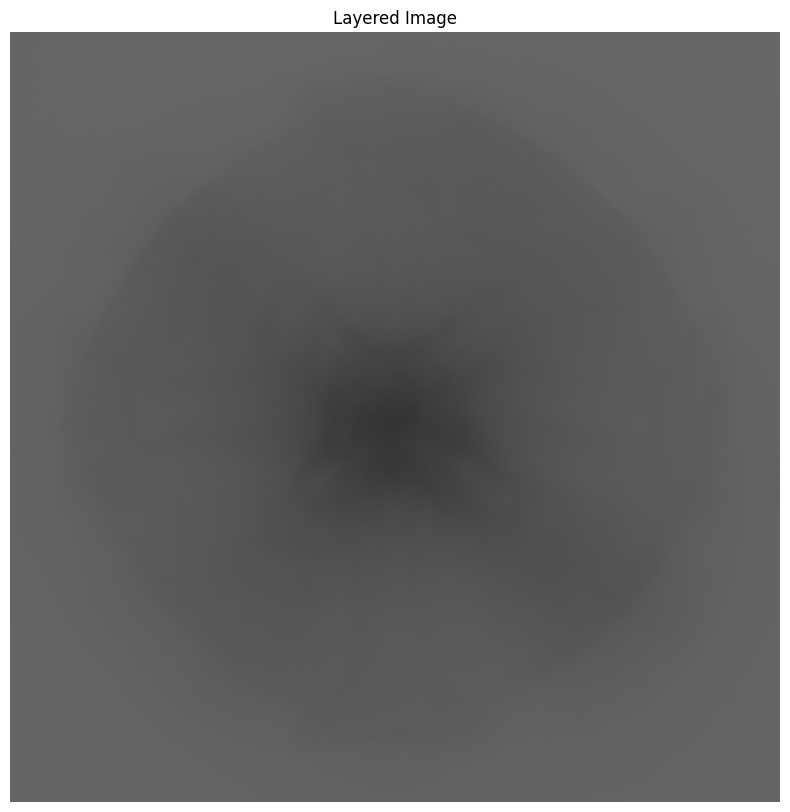

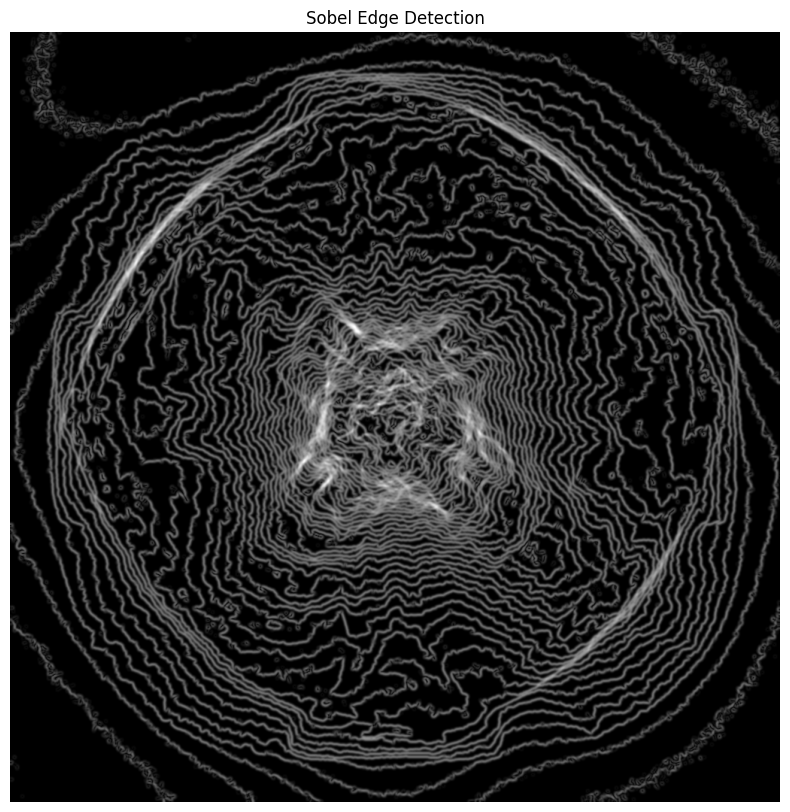

In [2]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt

def layer_images_transparently(folder_path, alpha=1.0):
    """
    Layers all images in a folder with transparency to find rotation bias.

    Args:
        folder_path (str): Path to the folder containing images.
        alpha (float): Transparency factor for blending (default is 1.0).

    Returns:
        np.ndarray: Resultant image of all layered transparent images.
    """
    # Get all image paths
    image_paths = [os.path.join(folder_path, img) for img in os.listdir(folder_path)]
    
    # Initialize the base image as zeros (black)
    first_img = cv2.imread(image_paths[0])
    height, width, channels = first_img.shape
    layered_image = np.zeros((height, width, channels), dtype=np.float32)
    
    # Load each image, convert to float, and add to the layered image
    for image_path in image_paths:
        img = cv2.imread(image_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Convert to RGB
        img = img.astype(np.float32) / 255.0  # Normalize to [0, 1]
        layered_image += img * alpha  # Add with transparency

    # Normalize the final layered image to [0, 1]
    layered_image /= len(image_paths)
    layered_image = np.clip(layered_image, 0, 1)

    # Convert back to uint8 for further processing
    layered_image = (layered_image * 255).astype(np.uint8)
    
    return layered_image

def detect_edges_sobel(image):
    """
    Detect edges in the image using the Sobel operator.

    Args:
        image (np.ndarray): Input image.

    Returns:
        np.ndarray: Edge-detected image.
    """
    # Convert image to grayscale
    gray_image = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)

    # Apply Sobel operator in x and y directions
    sobel_x = cv2.Sobel(gray_image, cv2.CV_64F, 1, 0, ksize=11)  # Horizontal edges
    sobel_y = cv2.Sobel(gray_image, cv2.CV_64F, 0, 1, ksize=11)  # Vertical edges

    # Compute the gradient magnitude
    sobel_magnitude = np.sqrt(sobel_x ** 2 + sobel_y ** 2)

    # Normalize the magnitude to the range [0, 255]
    sobel_magnitude = np.clip((sobel_magnitude / sobel_magnitude.max()) * 255, 0, 255).astype(np.uint8)
    
    return sobel_magnitude

def plot_image(image, title="Image"):
    """
    Plot an image using matplotlib.

    Args:
        image (np.ndarray): Image to plot.
        title (str): Title of the plot.
    """
    plt.figure(figsize=(10, 10))
    plt.imshow(image, cmap='gray')
    plt.axis('off')
    plt.title(title)
    plt.show()

# Example usage
train_folder = os.path.join(data_folder, 'screw', 'train', 'good')
layered_image = layer_images_transparently(train_folder, alpha=0.5)

# Detect edges using Sobel operator
sobel_edges = detect_edges_sobel(layered_image)

# Plot the result
plot_image(layered_image, title ='Layered Image')
plot_image(sobel_edges, title='Sobel Edge Detection')


Found 320 images belonging to 1 classes.


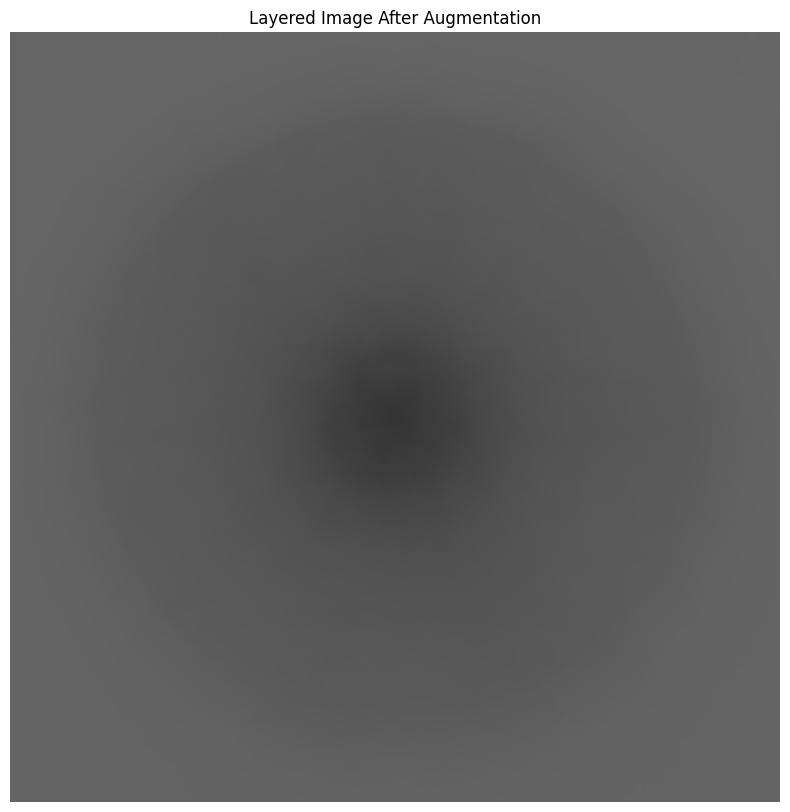

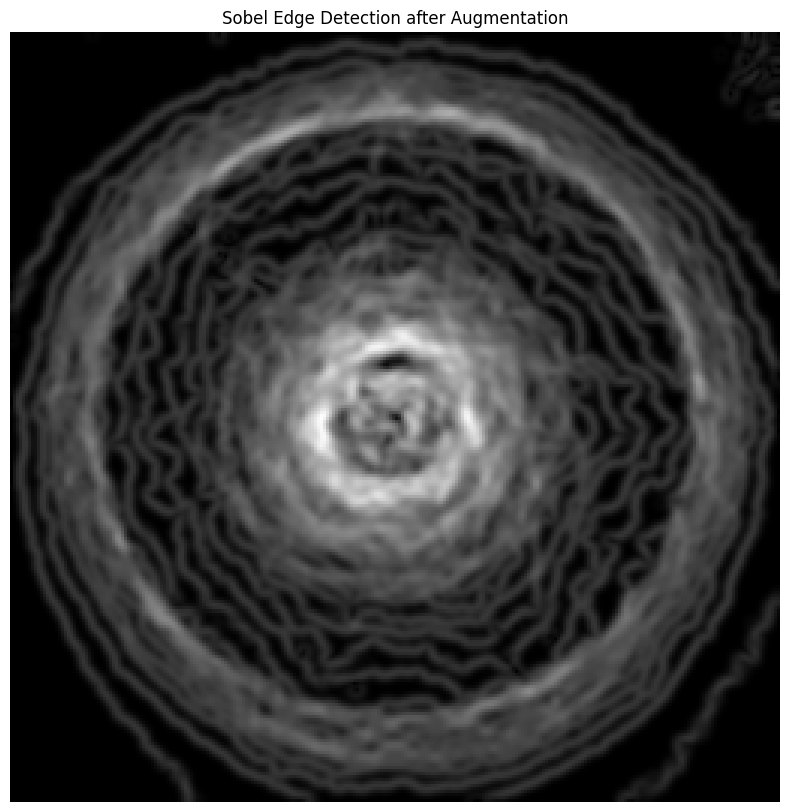

In [11]:
import numpy as np
import matplotlib.pyplot as plt
import cv2
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Function to layer images transparently
def layer_augmented_images(generator, num_images, alpha=1.0):
    # Get one batch of images from the generator
    layered_image = None
    count = 0

    for batch in generator:
        for img in batch[0]:  # Access the images from the batch
            if layered_image is None:
                layered_image = np.zeros_like(img, dtype=np.float32)

            layered_image += img * alpha
            count += 1

            if count >= num_images:
                break
        if count >= num_images:
            break

    # Normalize the final layered image to [0, 1]
    layered_image /= count
    layered_image = np.clip(layered_image, 0, 1)

    # Convert back to uint8 for visualization
    layered_image = (layered_image * 255).astype(np.uint8)

    return layered_image

# Function to detect edges using Sobel operator
def detect_edges_sobel(image):
    # Convert image to grayscale
    gray_image = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)

    # Apply Sobel operator in x and y directions
    sobel_x = cv2.Sobel(gray_image, cv2.CV_64F, 1, 0, ksize=11)  # Horizontal edges
    sobel_y = cv2.Sobel(gray_image, cv2.CV_64F, 0, 1, ksize=11)  # Vertical edges

    # Compute the gradient magnitude
    sobel_magnitude = np.sqrt(sobel_x ** 2 + sobel_y ** 2)

    # Normalize the magnitude to the range [0, 255]
    sobel_magnitude = np.clip((sobel_magnitude / sobel_magnitude.max()) * 255, 0, 255).astype(np.uint8)
    
    return sobel_magnitude

# Example usage
category = 'screw'
data_dir = f'../../data/{category}'
train_dir = f'{data_dir}/train'
test_dir = f'{data_dir}/test'
batch_size = 16
rotation_range = 90  # Ensure this matches your augmentation settings

# Define the ImageDataGenerator
augmented_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=rotation_range
)

# Create the data generator
aug_generator = augmented_datagen.flow_from_directory(
    train_dir,
    target_size=(256, 256),
    batch_size=batch_size,
    class_mode='input',
    color_mode='rgb',
    subset='training'
)

# Generate and layer images
layered_image = layer_augmented_images(aug_generator, num_images=len(aug_generator.filenames), alpha=0.5)

# Detect edges using Sobel operator
sobel_edges = detect_edges_sobel(layered_image)

# Plot the layered image
plt.figure(figsize=(10, 10))
plt.imshow(layered_image)
plt.axis('off')
plt.title("Layered Image After Augmentation")
plt.show()

# Plot the Sobel edge-detected image
plt.figure(figsize=(10, 10))
plt.imshow(sobel_edges, cmap='gray')
plt.axis('off')
plt.title("Sobel Edge Detection after Augmentation")
plt.show()
